In [3]:
!pip install pyarrow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.9/48.9 MB 23.5 MB/s  0:00:02m0:00:0100:01


In [12]:
import pandas as pd

df = pd.read_parquet("analysis_dataset.parquet")

print(df.head())
print(df.shape)

                                         name  \
0  20220202_Ag_UTC_330kx_2650e_0p1596s_08.dm3   

                                       cluster_image  
0  [[2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,...  
(1, 2)


(4096, 4096)
2
int64


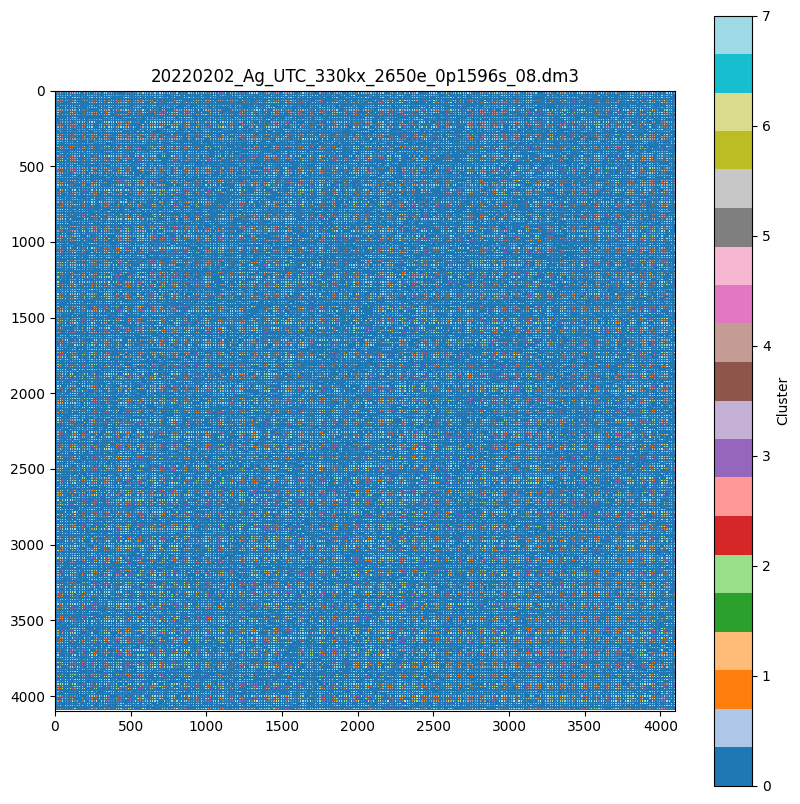

In [13]:
cluster_img = np.stack(row["cluster_image"], axis=0)
print(cluster_img.shape)
print(cluster_img.ndim)
print(cluster_img.dtype)

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
plt.imshow(cluster_img, cmap="tab20", interpolation="nearest")
plt.colorbar(label="Cluster")
plt.title(row["name"])
plt.show()


In [15]:
import glob
import os
from ncempy.io import dm
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler
import umap
from sklearn.cluster import KMeans
from skimage.util import view_as_windows
import numpy as np
from persim import PersistenceImager
from ripser import lower_star_img
import pandas as pd
from itertools import islice

/home/eng-6770/Documents/TEM_Exploration/.venv/lib/python3.14/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [14]:
import pandas as pd

df = pd.read_parquet("iamge_datapoint.parquet")

print(df.head())
print(df.shape)

   clustered
0          0
1          5
2          0
3          2
4          0
(261121, 1)


In [16]:
from pathlib import Path


base_dir = Path( "../hrtem_files/2022_02_02 5nm Ag nanoparticles on UTC")

image = base_dir / "20220202_Ag_UTC_330kx_2650e_0p1596s_05.dm3"

data_dict = dm.dmReader(str(Path(image).resolve()))
image = data_dict['data']

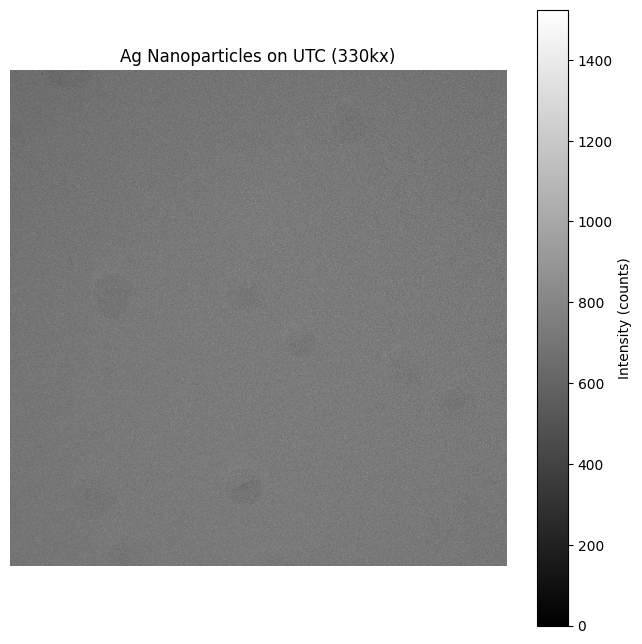

In [22]:
plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.title("Ag Nanoparticles on UTC (330kx)")
plt.colorbar(label='Intensity (counts)')
plt.axis('off') 
plt.show()


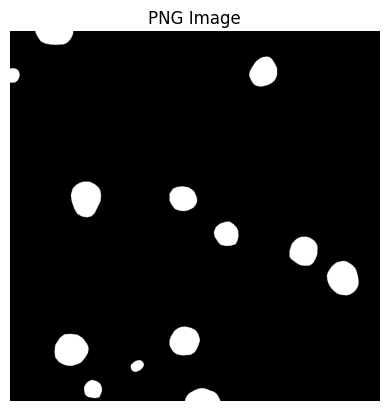

In [23]:
truth_image = (base_dir
        / "Labels"
        / "20220202_Ag_UTC_330kx_2650e_0p1596s_05_label.png"
    )
truth_image = mpimg.imread(truth_image)

plt.imshow(truth_image, cmap='gray')
plt.axis('off')
plt.title("PNG Image")
plt.show()

In [17]:
def get_positions(image_data, patch_size=16, stride=None):
    if stride is None:
        stride = patch_size

    blocks = view_as_windows(
        image_data,
        (patch_size, patch_size),
        step=stride
    )

    n_rows, n_cols = blocks.shape[:2]

    positions = [
        (i * stride, j * stride)
        for i in range(n_rows)
        for j in range(n_cols)
    ]

    return positions

def label_to_image(original_image, labels, positions, patch_size=16):
    H, W = original_image.shape[:2]

    label_img = np.zeros((H, W), dtype=np.uint8)
    vote_img  = np.zeros((H, W), dtype=np.uint8)

    for (r, c), lab in zip(positions, labels):
        r_end = min(r + patch_size, H)
        c_end = min(c + patch_size, W)

        region = (slice(r, r_end), slice(c, c_end))

        votes = vote_img[region] + 1

        mask = votes >= vote_img[region]

        label_patch = label_img[region]
        label_patch[mask] = lab

        vote_img[region][mask] = votes[mask]

    return label_img


In [42]:

labels = df["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

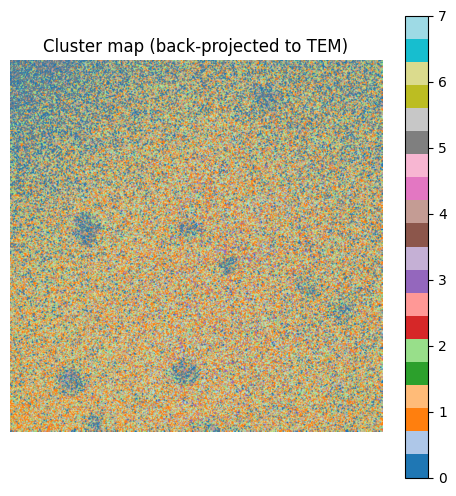

In [21]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()

/home/eng-6770/Documents/TEM_Exploration/.venv/lib/python3.14/site-packages/skimage/_shared/utils.py:386: UserWarning: Only one label was provided to `remove_small_objects`. Did you mean to use a boolean array?
  return func(*args, **kwargs)
/tmp/ipykernel_324545/1403494634.py:11: FutureWarning: `binary_closing` is deprecated since version 0.26 and will be removed in version 0.28. Use `skimage.morphology.closing` instead.
  clean = binary_closing(clean_mask, footprint=disk(2))


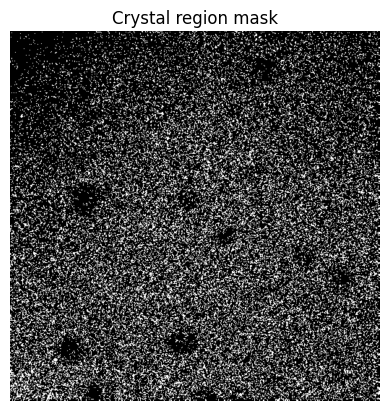

In [29]:
from skimage.morphology import remove_small_objects
from scipy.ndimage import binary_fill_holes
from skimage.morphology import binary_closing, disk

target_cluster = 1  

mask = (label_img == target_cluster).astype(np.uint8)

clean_mask = remove_small_objects(mask, max_size=100)
clean_mask = binary_fill_holes(clean_mask)
clean = binary_closing(clean_mask, footprint=disk(2))
#clean_mask = remove_small_objects(clean_mask, max_size=1600)
plt.imshow(mask, cmap="gray")
plt.title("Crystal region mask")
plt.axis("off")
plt.show()

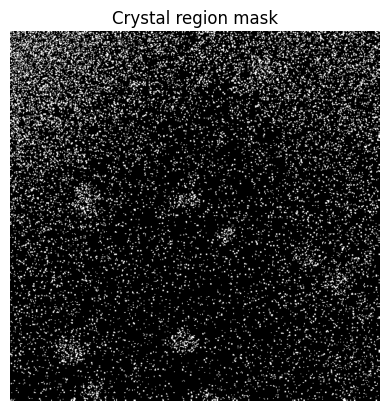

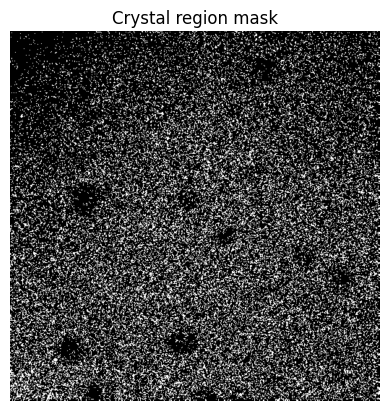

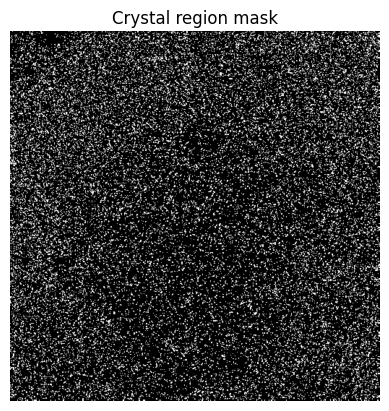

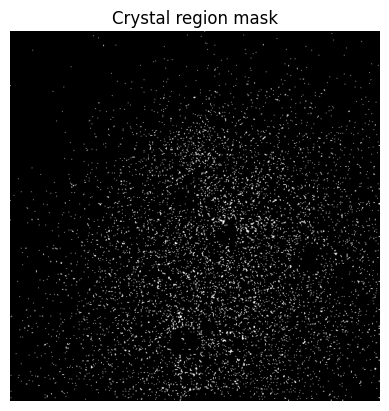

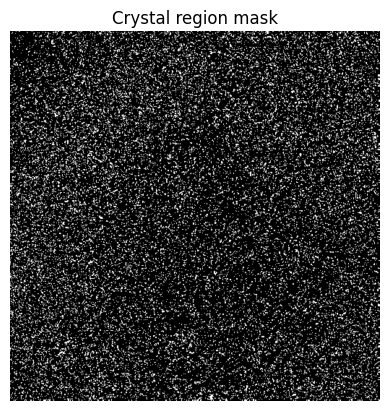

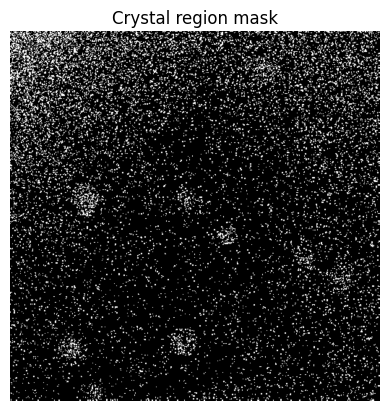

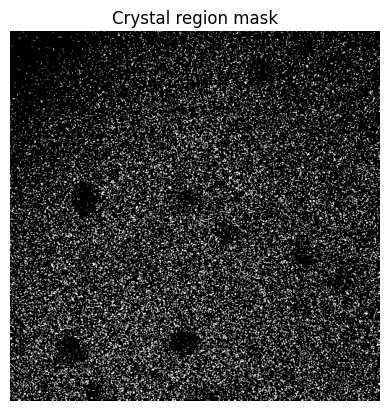

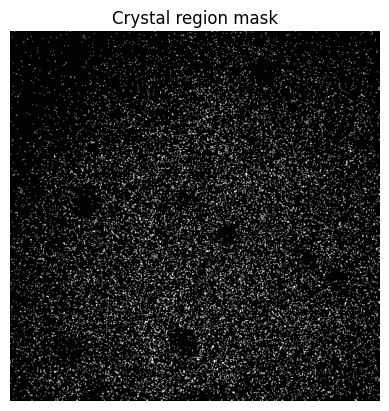

In [30]:
clusters = [0,1,2,3,4,5,6,7]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

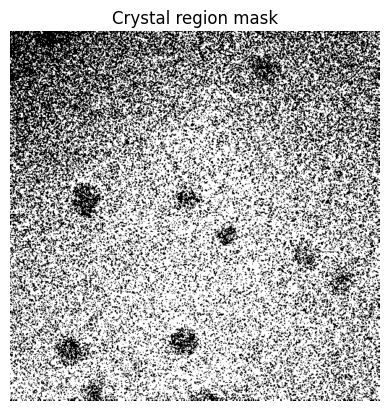

In [43]:
target_clusters = [1, 2, 3, 6, 7]

mask = np.isin(label_img, target_clusters).astype(np.uint8)
plt.imshow(mask, cmap="gray")
plt.title("Crystal region mask")
plt.axis("off")
plt.show()

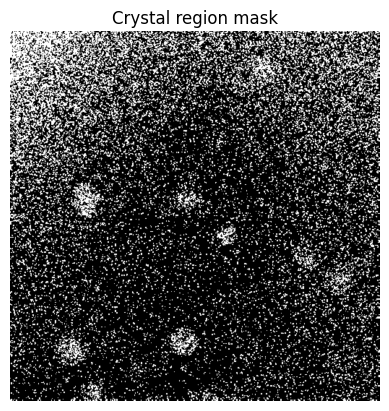

In [34]:
target_clusters = [0,5]

mask = np.isin(label_img, target_clusters).astype(np.uint8)
plt.imshow(mask, cmap="gray")
plt.title("Crystal region mask")
plt.axis("off")
plt.show()

In [ ]:
import pandas as pd

df_flipped = pd.read_parquet("image_datapoint.parquet")

print(df.head())
print(df.shape)

   clustered
0          0
1          5
2          0
3          2
4          0
(261121, 1)


In [38]:
labels = df_flipped["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

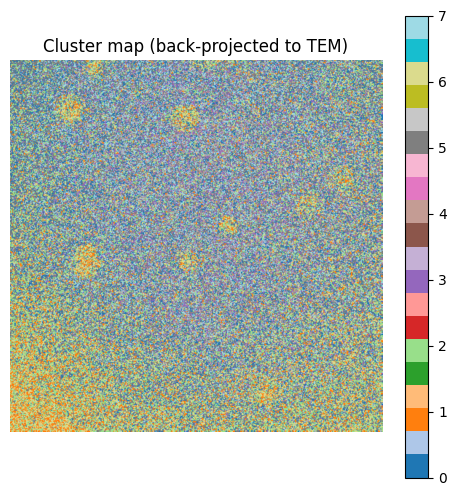

In [39]:
import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()

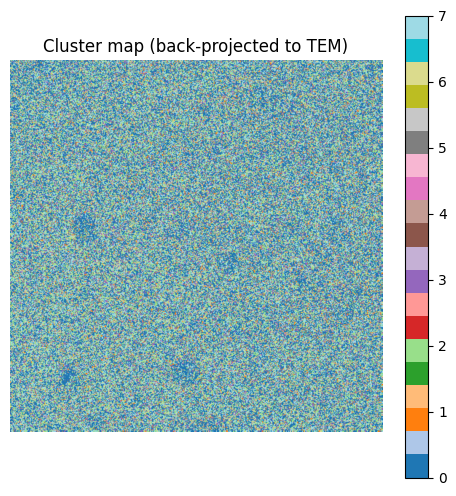

In [40]:
import pandas as pd

df_filtered = pd.read_parquet("image_datapoint_2.parquet")

labels = df_filtered["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()

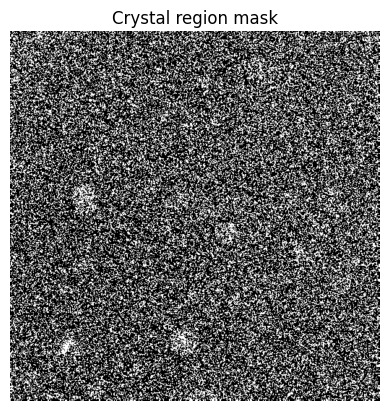

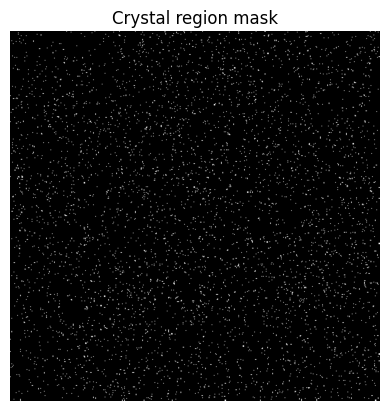

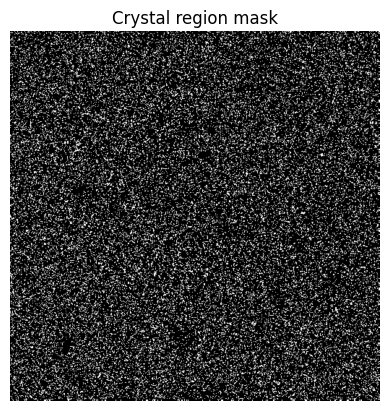

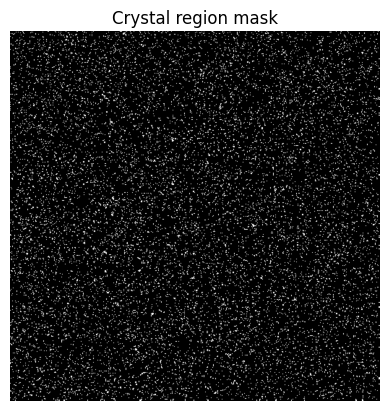

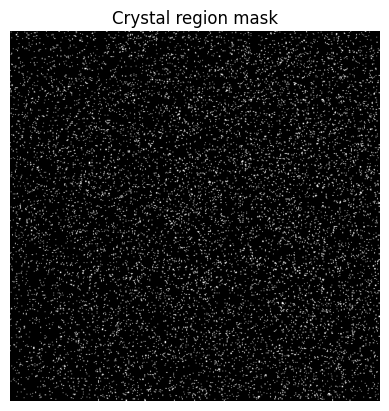

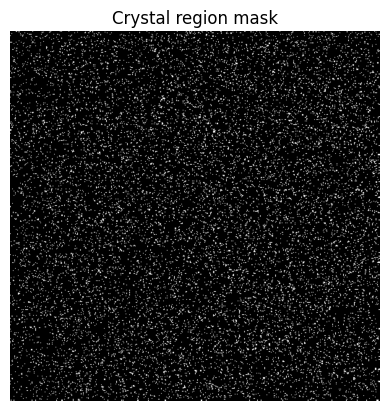

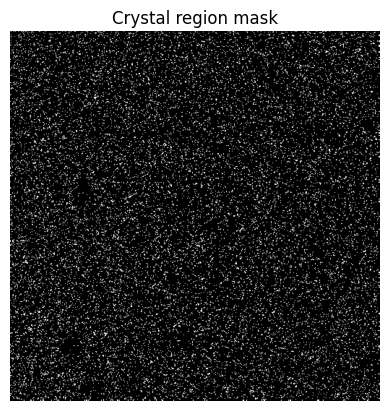

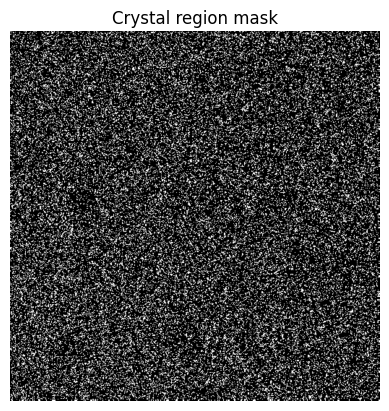

In [41]:
clusters = [0,1,2,3,4,5,6,7]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

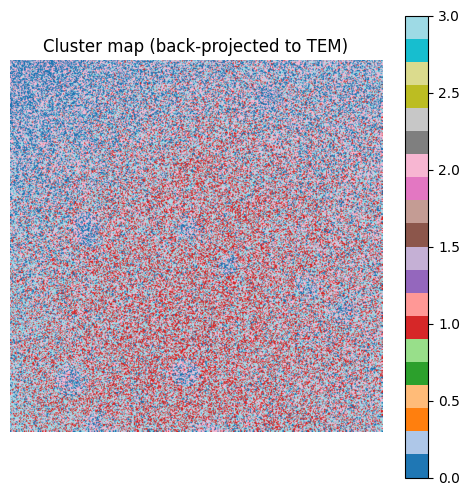

In [48]:
import pandas as pd

df_4 = pd.read_parquet("image_datapoint_4.parquet")

labels = df_4["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()

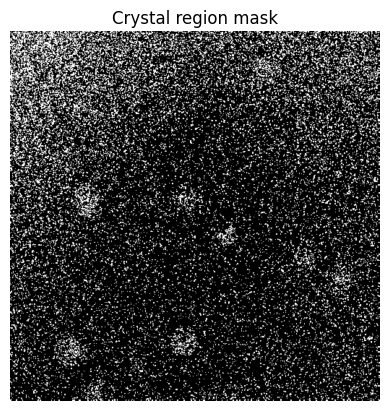

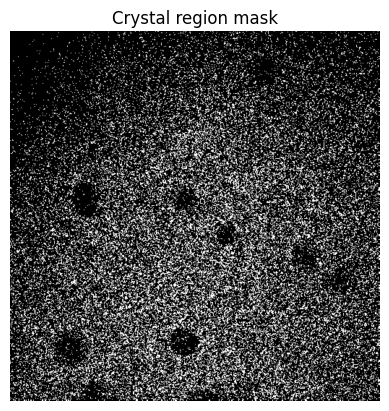

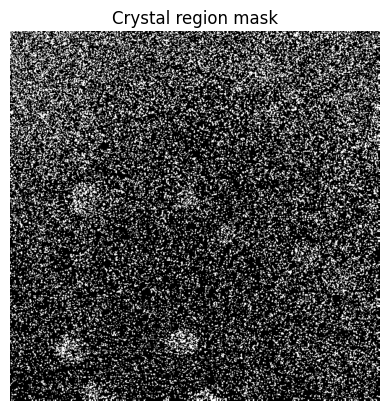

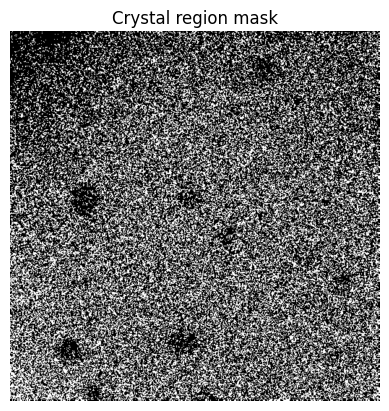

In [49]:
clusters = [0,1,2,3]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

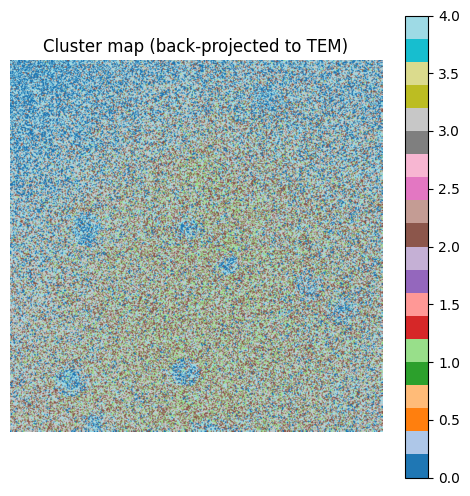

In [50]:
import pandas as pd

df_5 = pd.read_parquet("image_datapoint_5.parquet")

labels = df_5["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()

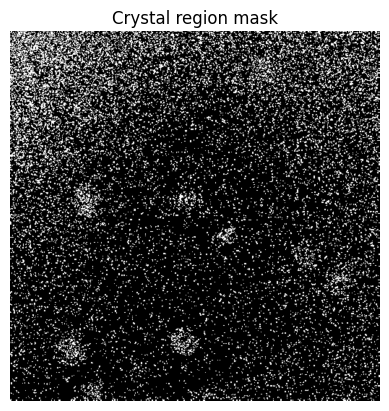

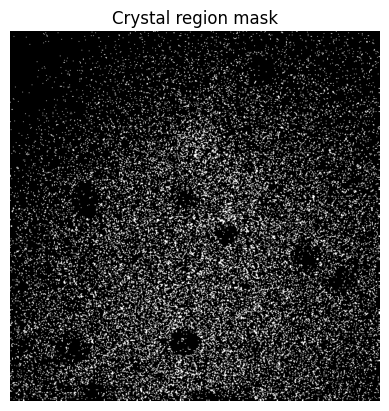

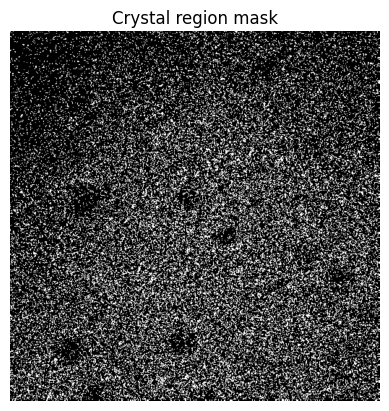

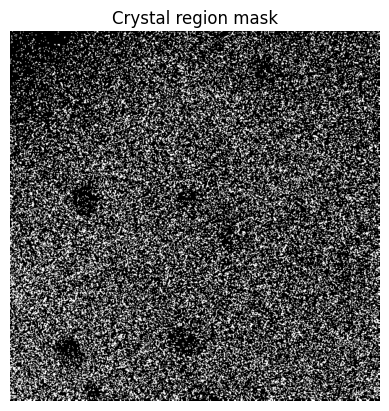

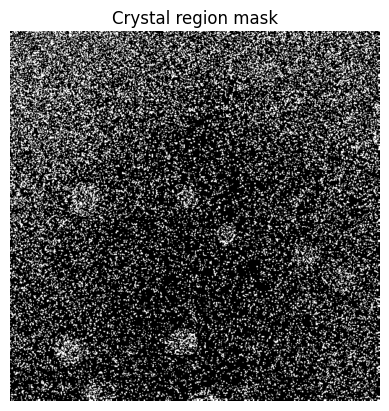

In [51]:
clusters = [0,1,2,3,4]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

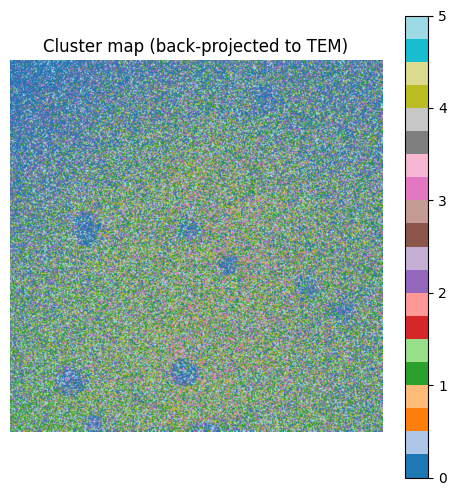

In [52]:
import pandas as pd

df_6 = pd.read_parquet("image_datapoint_6.parquet")

labels = df_6["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()

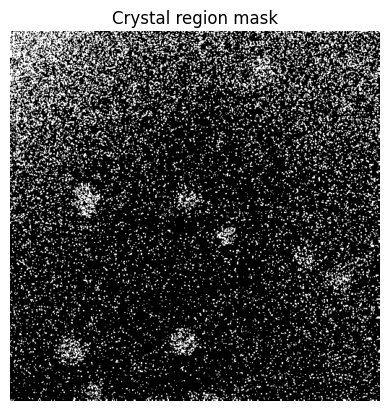

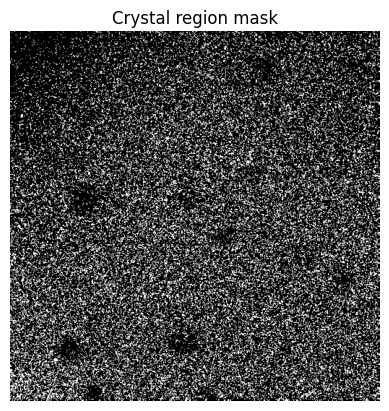

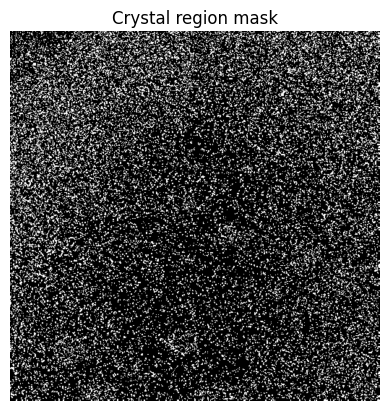

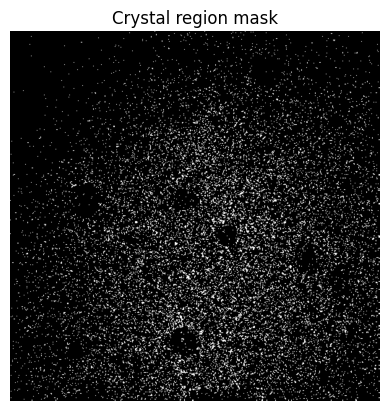

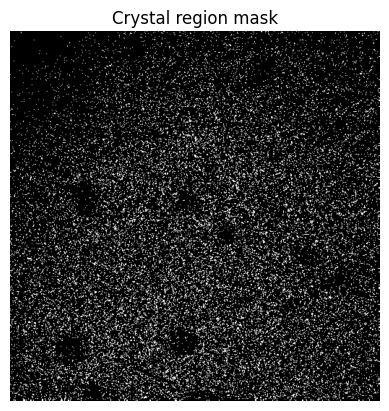

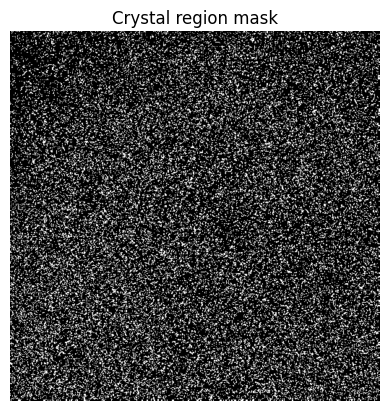

In [53]:
clusters = [0,1,2,3,4,5]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

In [ ]:
clusters = [0,1,2,3,4,5,6,7]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

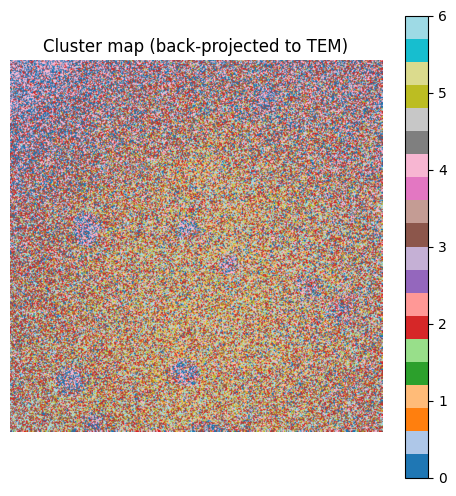

In [56]:
import pandas as pd

df_7 = pd.read_parquet("image_datapoint_7.parquet")

labels = df_7["clustered"].to_numpy().ravel()
positions = get_positions(image, 16, 8)
label_img = label_to_image(image, labels, positions)

import matplotlib.pyplot as plt

plt.figure(figsize=(6,6))
plt.imshow(label_img, cmap="tab20")
plt.title("Cluster map (back-projected to TEM)")
plt.colorbar()
plt.axis("off")
plt.show()


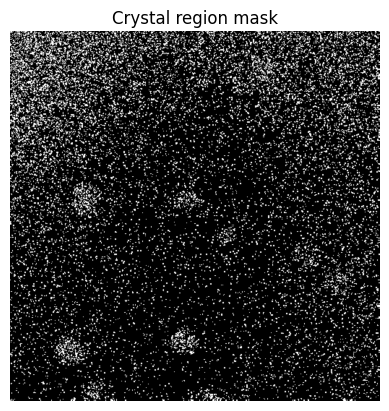

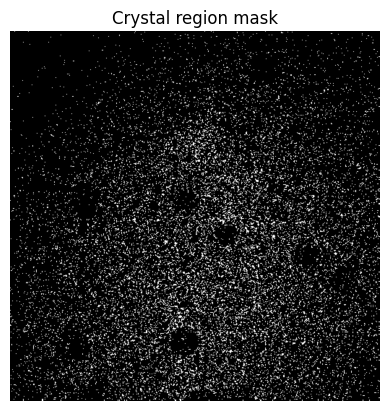

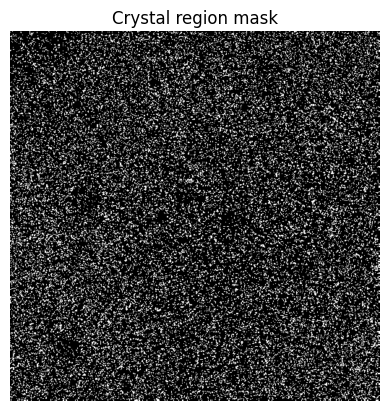

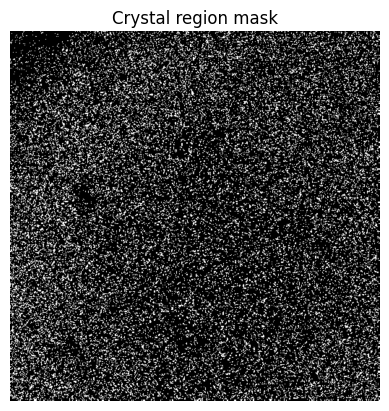

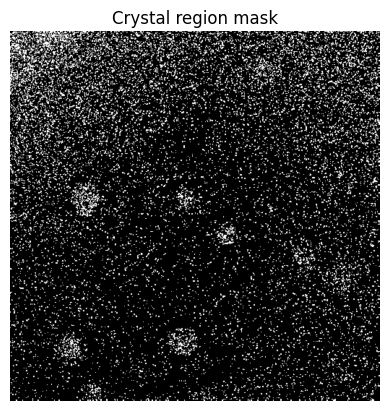

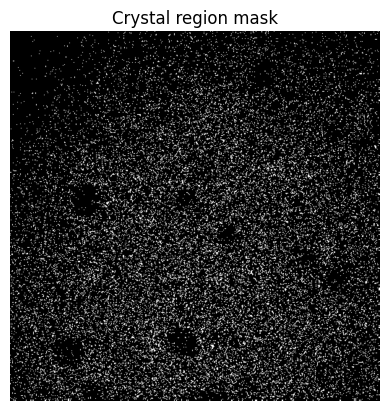

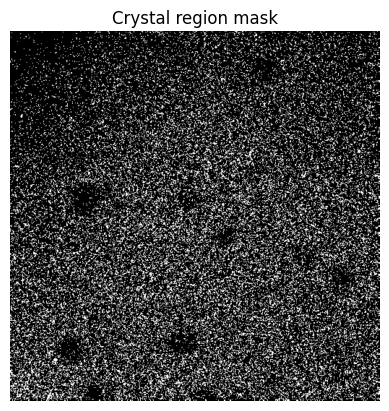

In [57]:
clusters = [0,1,2,3,4,5,6]

for i in clusters:
    mask = (label_img == i).astype(np.uint8)
    plt.imshow(mask, cmap="gray")
    plt.title("Crystal region mask")
    plt.axis("off")
    plt.show()

In [58]:
for cluster in np.unique(labels):
    print(cluster, image[label_img == cluster].mean())
    print(cluster, image[label_img == cluster].std())

0 698.6359
0 74.52626
1 739.488
1 67.2042
2 716.11127
2 69.38975
3 713.83374
3 68.38221
4 697.7975
4 75.19598
5 729.5281
5 67.53845
6 724.5809
6 68.53963


Text(0.5, 1.0, 'Row means')

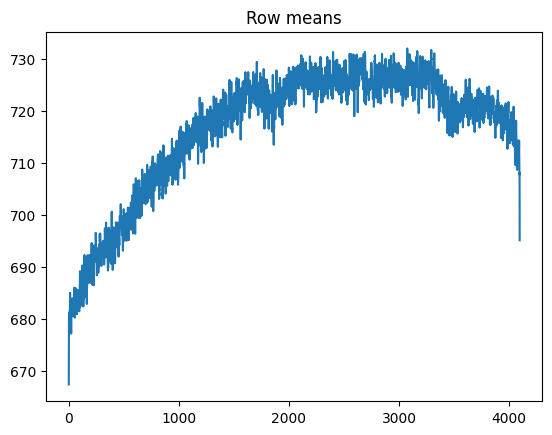

In [59]:
plt.plot(image.mean(axis=1))
plt.title("Row means")


Text(0.5, 1.0, 'Column means')

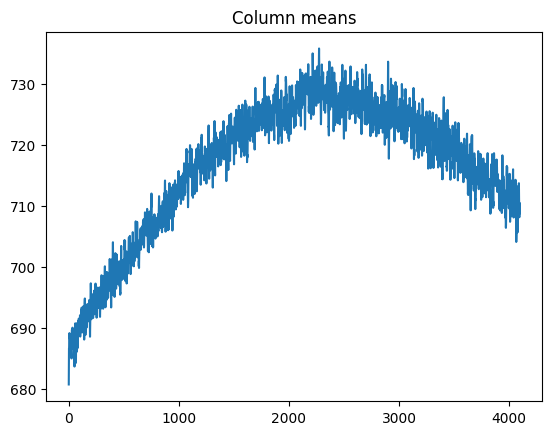

In [60]:
plt.plot(image.mean(axis=0))
plt.title("Column means")

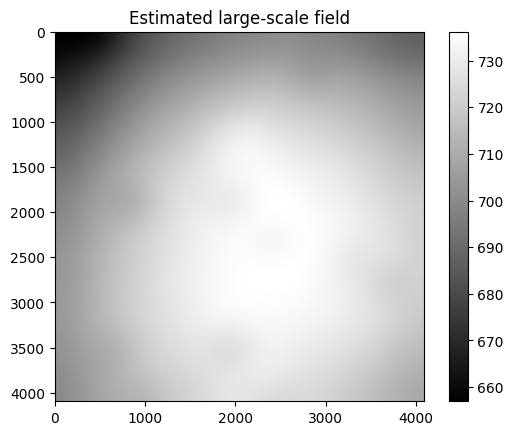

In [61]:
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt

background = gaussian_filter(image, sigma=200)

plt.imshow(background, cmap="gray")
plt.colorbar()
plt.title("Estimated large-scale field")
plt.show()